# Análise e predição da criminalidade urbana na cidade de São Paulo

# Configuração da base de dados

In [ ]:
%pip -q install geopandas geobr folium

     |████████████████████████████████| 1.1 MB 3.8 MB/s 
     |████████████████████████████████| 16.6 MB 129 kB/s 
     |████████████████████████████████| 7.8 MB 2.1 MB/s 
     |████████████████████████████████| 928 kB 48.1 MB/s 


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import geopandas as gpd
import numpy as np
import geobr
import os
import folium

from shapely.geometry import Point, Polygon, MultiPolygon
from google.colab import drive
from folium.plugins import HeatMap, FloatImage
from sklearn.linear_model import LinearRegression #Regressão linear
from sklearn import metrics #Cálculo do erro

drive.mount('/drive')
%matplotlib inline
rl = LinearRegression()

Mounted at /drive


In [ ]:
%%time
year_dict = {
    2007: ["BO_2007_1.csv", "BO_2007_2.csv"],
    2008: ["BO_2008_1.csv", "BO_2008_2.csv"],
    2009: ["BO_2009_1.csv", "BO_2009_2.csv"],
    2010: ["BO_2010_1.csv", "BO_2010_2.csv"],
    2011: ["BO_2011_1.csv", "BO_2011_2.csv"],
    2012: ["BO_2012_1.csv", "BO_2012_2.csv"],
    2013: ["BO_2013_1.csv", "BO_2013_2.csv"],
    2014: ["BO_2014_1.csv", "BO_2014_2.csv"],
    2015: ["BO_2015.csv"],
    2016: ["BO_2016.csv"]
}

dfs_dict = {}

for year, filenames in year_dict.items():
    # carrega os arquivos em uma lista de dataframes
    dfs = [pd.read_csv(f"/drive/Shareddrives/Tcc2022PP/bases/crimes_sp/{filename}") for filename in filenames]

    # separa os dataframes por ano em um dicionario
    dfs_dict[year] = pd.concat(dfs, ignore_index=True)

<timed exec>:18: DtypeWarning: Columns (17,18,21,26) have mixed types.Specify dtype option on import or set low_memory=False.
<timed exec>:18: DtypeWarning: Columns (24,26) have mixed types.Specify dtype option on import or set low_memory=False.
<timed exec>:18: DtypeWarning: Columns (26) have mixed types.Specify dtype option on import or set low_memory=False.
<timed exec>:18: DtypeWarning: Columns (26,32,33) have mixed types.Specify dtype option on import or set low_memory=False.
<timed exec>:18: DtypeWarning: Columns (15,17,18,21,26,30) have mixed types.Specify dtype option on import or set low_memory=False.
<timed exec>:18: DtypeWarning: Columns (15,17,18,21,44,45,47,50) have mixed types.Specify dtype option on import or set low_memory=False.
<timed exec>:18: DtypeWarning: Columns (31) have mixed types.Specify dtype option on import or set low_memory=False.
<timed exec>:18: DtypeWarning: Columns (15,17,18,21,28,29) have mixed types.Specify dtype option on import or set low_memory=Fa

CPU times: user 3min 5s, sys: 16.5 s, total: 3min 21s
Wall time: 4min 27s


In [ ]:
df = pd.read_csv("/drive/Shareddrives/Tcc2022PP/bases/crimes_sp/BO_2016.csv")

/usr/local/lib/python3.8/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (19,21) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
dfc = dfs_dict[2014] # dataframe com todas as colunas (mais informações)

In [ ]:
dfc.columns

Index(['NUM_BO', 'ANO_BO', 'ID_DELEGACIA', 'NOME_DEPARTAMENTO',
       'NOME_SECCIONAL', 'DELEGACIA', 'NOME_DEPARTAMENTO_CIRC',
       'NOME_SECCIONAL_CIRC', 'NOME_DELEGACIA_CIRC', 'ANO', 'MES',
       'DATA_OCORRENCIA_BO', 'HORA_OCORRENCIA_BO', 'FLAG_STATUS', 'RUBRICA',
       'DESDOBRAMENTO', 'CONDUTA', 'LATITUDE', 'LONGITUDE', 'CIDADE',
       'LOGRADOURO', 'NUMERO_LOGRADOURO', 'FLAG_STATUS.1', 'DESCR_TIPO_PESSOA',
       'CONT_PESSOA', 'SEXO_PESSOA', 'IDADE_PESSOA', 'COR', 'DESCR_PROFISSAO',
       'DESCR_GRAU_INSTRUCAO'],
      dtype='object')

# Tipo de ocorrência

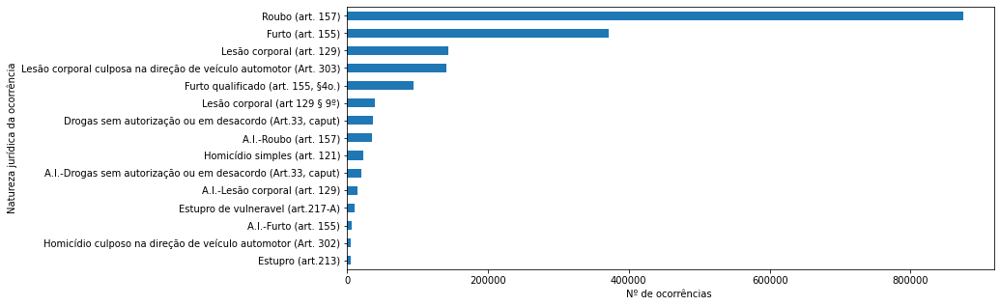

In [ ]:
fig, ax = plt.subplots(figsize=(12,5))
dfc.RUBRICA.dropna().value_counts().head(15).sort_values().plot.barh(ax=ax)
ax.set_xlabel('Nº de ocorrências ')  
ax.set_ylabel('Natureza jurídica da ocorrência')
fig.savefig('tipos_ocorrencias.png')

# Data das ocorrências

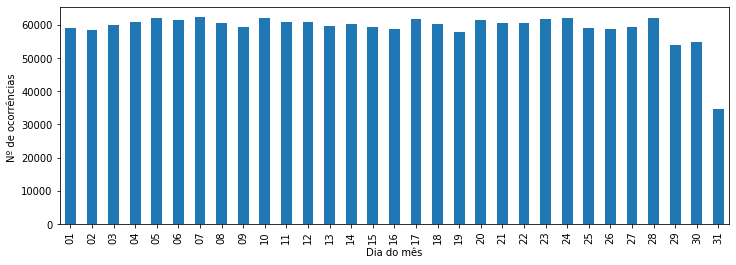

In [ ]:
fig, ax = plt.subplots(figsize=(12,4))
dfc['DATA_OCORRENCIA_BO'].dropna().apply(lambda s: s[:2]).value_counts().sort_index().plot.bar(ax=ax)
ax.set_ylabel('Nº de ocorrências ')  
ax.set_xlabel('Dia do mês')
fig.savefig('dias_do_mes.png')

É possível concluir que o dia do mês não influencia nas ocorrências, visto que há uma distribuição homogênea da quantidade de ocorrências em todos os dias do mês (excluindo os dias 29, 30 e 31 que não tem em todo mês)

In [ ]:
x_mes = dfc['MES'].dropna().value_counts().sort_index()

In [ ]:
dict_dias_mes = {
    1: 31,
    2: 28,
    3: 31,
    4: 30,
    5: 31,
    6: 30,
    7: 31,
    8: 31,
    9: 30,
    10: 31,
    11: 30,
    12: 31,
}

month_name = {
    1: 'janeiro',
    2: 'fevereiro',
    3: 'março',
    4: 'abril',
    5: 'maio',
    6: 'junho',
    7: 'julho',
    8: 'agosto',
    9: 'setembro',
    10: 'outubro',
    11: 'novembro',
    12: 'dezembro'
}

output_dict_dias_mes = {}

for mes, n in zip(x_mes.index, x_mes.values):
    # print(mes, int(n/dict_dias_mes[mes]))
    output_dict_dias_mes[month_name[mes]] = int(n/dict_dias_mes[mes])

x_mes = pd.Series(output_dict_dias_mes)

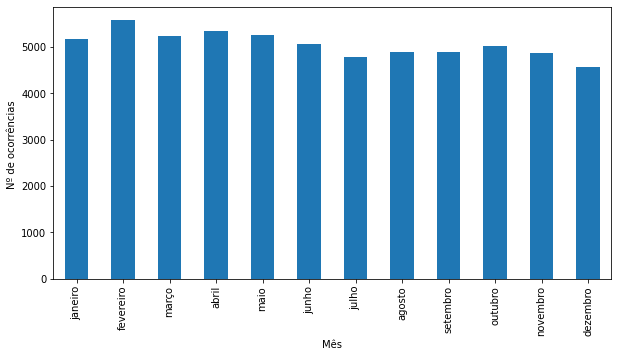

In [ ]:
fig, ax = plt.subplots(figsize=(10,5))
x_mes.plot.bar(ax=ax)
ax.set_ylabel('Nº de ocorrências ')  
ax.set_xlabel('Mês')
fig.savefig('meses.png')

# Horário das ocorrências

In [ ]:
horarios_ocorrencias = dfc[dfc['HORA_OCORRENCIA_BO'].notnull()]['HORA_OCORRENCIA_BO'] # pega a quantidade de ocorrencias em cada horario
df_horarios = horarios_ocorrencias.to_frame(name='hora') # cria um dataframe apenas com os horarios das ocorrencias
df_horarios.hora = df_horarios.hora.apply(lambda s: f'{s}:00') # adiciona os segundos à coluna hora para uma operação posterior

df_horarios['datetime'] = pd.to_datetime(df_horarios.hora, infer_datetime_format=True) 
# cria uma coluna no formato DateTime que possibilita realizar operações sobre os horários mais facilmente

horarios_ocorrencias = horarios_ocorrencias.apply(lambda x: f'{x[:3]}00 - {x[:3]}59') # reseta os minutos pra 0 pra agrupar os dados

In [ ]:
srs_horarios = horarios_ocorrencias.value_counts()
horarios_resetados = srs_horarios.reset_index()

dict_traducao = {'index': 'período de tempo', 'HORA_OCORRENCIA_BO': 'Nº de ocorrências'} # renomear colunas do dataframe
horarios_resetados.rename(columns=dict_traducao, inplace=True)
horarios_resetados.set_index('período de tempo', inplace=True)

In [ ]:
horarios_resetados = horarios_resetados.sort_index()
horarios_resetados

,Nº de ocorrências
período de tempo,
00:00 - 00:59,36774
01:00 - 01:59,29234
02:00 - 02:59,23026
03:00 - 03:59,19464
04:00 - 04:59,27992
05:00 - 05:59,45416
06:00 - 06:59,52037
07:00 - 07:59,49312
08:00 - 08:59,44087


In [ ]:
horarios_resetados.sum()

Nº de ocorrências    1314020
dtype: int64

In [ ]:
horarios_resetados[-6:]['Nº de ocorrências'].sum()

461737

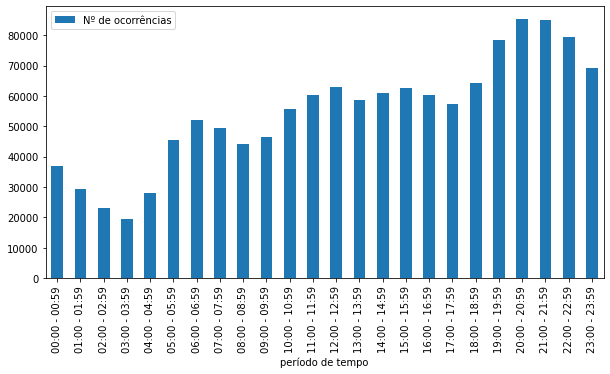

In [ ]:
fig, ax = plt.subplots(figsize=(10, 5))
horarios_resetados.plot(ax=ax, kind='bar')
fig.savefig('horarios_ocorrencias.png')

In [ ]:
horarios_resetados.max()

Nº de ocorrências    85216
dtype: int64

In [ ]:
horarios_resetados.min()

Nº de ocorrências    19464
dtype: int64

# Mapas

In [ ]:
dfm = df[df.LATITUDE != 'Informação restrita (art. 31 da LAI)']
dfm = dfm[dfm.LONGITUDE != 'Informação restrita (art. 31 da LAI)']
dfm = dfm[dfm.LATITUDE.apply(lambda x: str(x)[1:].replace('.', '').isnumeric())]
dfm = dfm[dfm.LONGITUDE.apply(lambda x: str(x)[1:].replace('.', '').isnumeric())]

dfm['geometry'] = list(zip(pd.to_numeric(dfm.LONGITUDE), pd.to_numeric(dfm.LATITUDE))) # cria a coluna geometry 
dfm['geometry'] = dfm['geometry'].apply(Point)
gdf = gpd.GeoDataFrame(dfm, geometry='geometry')
gdf = gdf[gdf['CIDADE'].str.contains('S.PAULO')] # filtra as ocorrências apenas na cidade de São Paulo

/usr/local/lib/python3.8/dist-packages/geopandas/geodataframe.py:34: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  out = from_shapely(data)


In [ ]:
df.LATITUDE.shape

(774662,)

In [ ]:
dfm.shape

(731959, 23)

In [ ]:
gdf_sp = geobr.read_municipality(code_muni=3550308) # obtém mapa da cidade de SP
mapa_spc = gdf_sp['geometry'].squeeze()
pontos_sp = gdf[gdf.within(mapa_spc)]

/usr/local/lib/python3.8/dist-packages/geopandas/array.py:93: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  aout[:] = out


/usr/local/lib/python3.8/dist-packages/descartes/patch.py:62: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  vertices = concatenate([


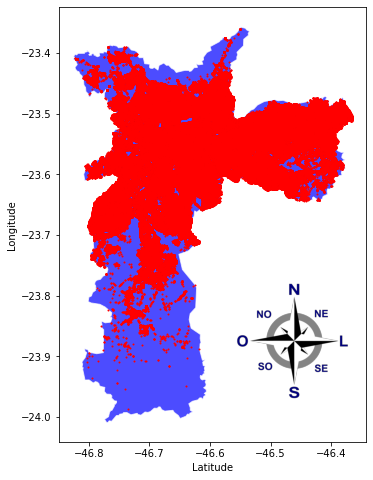

In [ ]:
img = plt.imread('/drive/Shareddrives/Tcc2022PP/code/Rosa_dos_Ventos.png')

fig, ax = plt.subplots(figsize=(8,8)) # cria figura e referência
gdf_sp.plot(ax=ax, edgecolor='w', color='b', alpha=0.7, label='Mapa da cidade de São Paulo') # plota o mapa de sp
pontos_sp.plot(ax=ax, color='r', markersize=1, label='Ocorrências Criminais') # plota os pontos das ocorrências
ax.set_ylabel('Longitude')  
ax.set_xlabel('Latitude')

newax = fig.add_axes([0.55,0.2,0.2,0.2], anchor='NE', zorder=1)
newax.imshow(img)
newax.axis('off')

fig.savefig('mapa_pontilhado.png') # salva a imagem do plot

In [ ]:
coordenadas = []
for p in gdf['geometry']:
  coordenadas.append([p.y, p.x])
mapa = folium.Map(location=[-23.5489, -46.6388], min_zoom=9)
HeatMap(coordenadas, radius=11, blur=12, max_zoom=10).add_to(mapa)
compass_rose = folium.FeatureGroup('compass rose')
FloatImage('https://upload.wikimedia.org/wikipedia/commons/9/99/Compass_rose_simple.svg', bottom=80, left=7).add_to(compass_rose)
compass_rose.add_to(mapa)
mapa

# Previsão utilizando regressão linear

In [ ]:
%%time
arquivos = ["BO_2007_1.csv", "BO_2007_2.csv", "BO_2008_1.csv", "BO_2008_2.csv", "BO_2009_1.csv", "BO_2009_2.csv", "BO_2010_1.csv", "BO_2010_2.csv", "BO_2011_1.csv", "BO_2011_2.csv", "BO_2012_1.csv", "BO_2012_2.csv", "BO_2013_1.csv", "BO_2013_2.csv", "BO_2014_1.csv", "BO_2014_2.csv", "BO_2015.csv", "BO_2016.csv", "RDO_1.csv", "RDO_2.csv", "RDO_3.csv"]
ocorrencias = {}

for arquivo in arquivos:
    df_arq = pd.read_csv(f"/drive/Shareddrives/Tcc2022PP/bases/crimes_sp/{arquivo}", usecols=['ANO_BO', 'CIDADE'], squeeze=True) # o squeeze é pra retornar uma series em vez de dataframe
    df_arq = df_arq[df_arq['CIDADE'].str.contains('S.PAULO')] # filtra apenas as ocorrências na cidade de São Paulo
    df_arq = df_arq['ANO_BO'] # retira a coluna com a cidade e transforma em uma series com apenas o ano
    
    for ano, num_ocorrencias in df_arq.value_counts().items():
        try:
            ocorrencias[ano] += num_ocorrencias
        except KeyError:
            ocorrencias[ano] = num_ocorrencias

CPU times: user 1min 44s, sys: 8.79 s, total: 1min 53s
Wall time: 2min 19s


In [ ]:
ocorrencias.pop(2006)
ocorrencias.pop(2017)
# remove os anos em que as ocorrências registradas são poucas, o que atrapalharia na regressão linear
ocorrencias_2 = ocorrencias.copy()
ocorrencias_2.pop(2015)
ocorrencias_2.pop(2016)

1026037

Número de ocorrências em 2017: 1273731.87
Número de ocorrências em 2018: 1300384.79
Número de ocorrências em 2019: 1327037.71
Número de ocorrências em 2020: 1353690.63
Número de ocorrências em 2021: 1380343.55
Número de ocorrências em 2022: 1406996.47
Número de ocorrências em 2023: 1433649.39


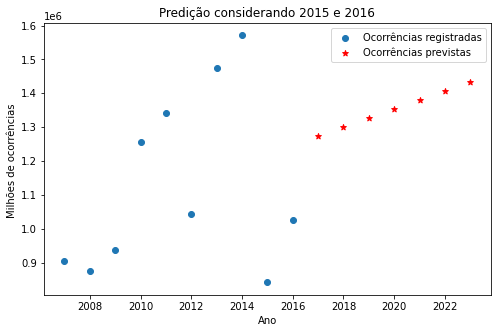

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5))

# grafico com todos os anos incluidos
# predicao
srs_ocorrencias = pd.Series(ocorrencias)
indep = srs_ocorrencias.index.values.reshape(-1,1) # variável independente
dep = srs_ocorrencias.values.flatten() # variável dependente
rl.fit(indep, dep)
x = [[2017], [2018], [2019], [2020], [2021], [2022],[2023]] # valores para a variável independente
y_pred = rl.predict(np.array(x).reshape(-1,1)) # calcula a predição

# plot
ax.scatter(indep, dep, label='Ocorrências registradas')
ax.scatter(x, y_pred, color='red', label='Ocorrências previstas', marker='*')
ax.set_ylabel('Milhões de ocorrências ')  
ax.set_xlabel('Ano')
ax.set_title('Predição considerando 2015 e 2016')
ax.legend()

fig.savefig('predicao1.png')

x = [[2017], [2018], [2019], [2020], [2021], [2022],[2023]] # valores para a variável independente
x_arr = np.array(x).reshape(-1,1) # prepara para o formato adequado
y_pred = rl.predict(x_arr) # calcula a predição
for ano, numero in zip(x_arr.flatten(), y_pred.flatten()):
    print(f"Número de ocorrências em {ano}: {numero:.2f}")

In [ ]:
y = dep #valores originais
y_pred = rl.predict(indep)
ema = metrics.mean_absolute_error(y, y_pred)
emq = metrics.mean_squared_error(y, y_pred)
print('Média absoluta dos erros:', int(ema))
print('Média quadrática dos erros:', int(emq))

Média absoluta dos erros: 216371
Média quadrática dos erros: 57036729801


Coeficiente angular da reta: ~26653


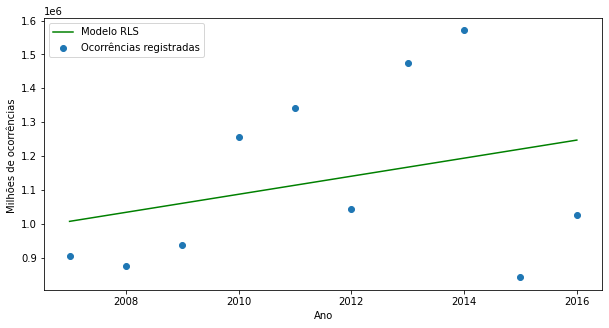

In [ ]:
fig, ax = plt.subplots(figsize=(10,5))
print(f"Coeficiente angular da reta: ~{rl.coef_[0]:.0f}")
ax.scatter(indep, dep, label='Ocorrências registradas')
x = [min(indep),max(indep)] #Valor para a variável independente
x_arr = np.array(x).reshape(-1,1) #prepara para o formato adequado
y_pred = rl.predict(x_arr) #calcula a predição
ax.plot(x, y_pred, color='green', label='Modelo RLS')
ax.set_ylabel('Milhões de ocorrências ')  
ax.set_xlabel('Ano')
ax.legend()

fig.savefig('reta.png')

Número de ocorrências em 2017: 1800613.86
Número de ocorrências em 2018: 1896791.39
Número de ocorrências em 2019: 1992968.93
Número de ocorrências em 2020: 2089146.46
Número de ocorrências em 2021: 2185324.00
Número de ocorrências em 2022: 2281501.54
Número de ocorrências em 2023: 2377679.07


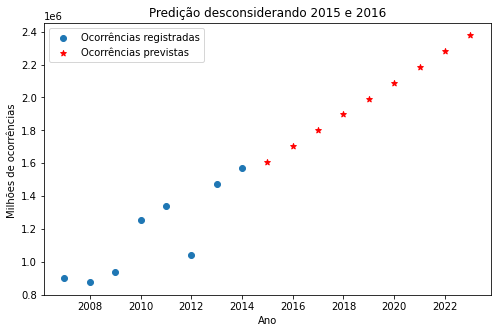

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5))

# grafico sem 2015 e 2016
# predicao
srs_ocorrencias = pd.Series(ocorrencias_2)
indep = srs_ocorrencias.index.values.reshape(-1,1) # variável independente
dep = srs_ocorrencias.values.flatten() # variável dependente
rl.fit(indep, dep)
x = [[2015], [2016], [2017], [2018], [2019], [2020], [2021], [2022],[2023]] # valores para a variável independente
y_pred = rl.predict(np.array(x).reshape(-1,1)) # calcula a predição

#plot
ax.scatter(indep, dep, label='Ocorrências registradas')
ax.scatter(x, y_pred, color='red', label='Ocorrências previstas', marker='*')
ax.set_ylabel('Milhões de ocorrências ')  
ax.set_xlabel('Ano')
ax.set_title('Predição desconsiderando 2015 e 2016')
ax.legend()

fig.savefig('predicao2.png')

x = [[2017], [2018], [2019], [2020], [2021], [2022],[2023]] # valores para a variável independente
x_arr = np.array(x).reshape(-1,1) # prepara para o formato adequado
y_pred = rl.predict(x_arr) # calcula a predição
for ano, numero in zip(x_arr.flatten(), y_pred.flatten()):
    print(f"Número de ocorrências em {ano}: {numero:.2f}")

In [ ]:
y = dep #valores originais
y_pred = rl.predict(indep)
ema = metrics.mean_absolute_error(y, y_pred)
emq = metrics.mean_squared_error(y, y_pred)
print('Média absoluta dos erros:', int(ema))
print('Média quadrática dos erros:', int(emq))

Média absoluta dos erros: 107374
Média quadrática dos erros: 16260958576


Coeficiente angular da reta: ~96178


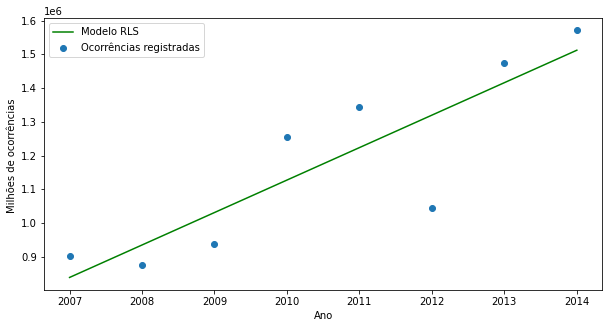

In [ ]:
fig, ax = plt.subplots(figsize=(10,5))
print(f"Coeficiente angular da reta: ~{rl.coef_[0]:.0f}")
ax.scatter(indep, dep, label='Ocorrências registradas')
x = [min(indep),max(indep)] #Valor para a variável independente
x_arr = np.array(x).reshape(-1,1) #prepara para o formato adequado
y_pred = rl.predict(x_arr) #calcula a predição
ax.plot(x, y_pred, color='green', label='Modelo RLS')
ax.set_ylabel('Milhões de ocorrências ')  
ax.set_xlabel('Ano')
ax.legend()

fig.savefig('reta2.png')